In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.impute import SimpleImputer, KNNImputer


# Data Processing 

In [10]:
# Load the dataset
df = pd.read_csv("water_potability.csv")
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [14]:
# Information about data types and missing values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [16]:
# Statistical summary
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [18]:
# Check for missing values in each column
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

In [20]:
# Fill missing values with mean
df.fillna(df.mean(), inplace=True)   

# # Normalize numerical features

In [22]:
scaler = MinMaxScaler()
numeric_cols = df.select_dtypes(include=[np.number]).columns
df[numeric_cols] = scaler.fit_transform(df[numeric_cols])

In [79]:
# Verify the cleaned data
df.isnull().sum()
print("Dataset is cleaned now !")

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [73]:
# Save cleaned dataset
df.to_csv('cleaned_sales_data.csv', index=False)

In [75]:
cleaned_Data = pd.read_csv("cleaned_sales_data.csv")
cleaned_Data

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.505771,0.571139,0.336096,0.543891,0.680385,0.669439,0.313402,0.699753,0.286091,0.0
1,0.505771,0.297400,0.300611,0.491839,0.581699,0.719411,0.497319,0.450999,0.576793,0.0
2,0.578509,0.641311,0.321619,0.698543,0.581699,0.414652,0.562017,0.532866,0.303637,0.0
3,0.594055,0.605536,0.356244,0.603314,0.647347,0.317880,0.622089,0.808065,0.601015,0.0
4,0.649445,0.484851,0.289922,0.484900,0.514545,0.379337,0.358555,0.253606,0.496327,0.0
...,...,...,...,...,...,...,...,...,...,...
3271,0.333436,0.530482,0.338338,0.533436,0.656047,0.603192,0.448062,0.535037,0.564534,1.0
3272,0.557775,0.530016,0.279263,0.603473,0.581699,0.368912,0.678284,0.532673,0.254915,1.0
3273,0.672822,0.465486,0.539101,0.547807,0.581699,0.438152,0.338662,0.560655,0.349570,1.0
3274,0.366197,0.664407,0.191490,0.465860,0.581699,0.387157,0.343638,0.622659,0.616120,1.0


# Exploratory Data Analysis (EDA):

In [107]:
cleaned_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   float64
dtypes: float64(10)
memory usage: 256.1 KB


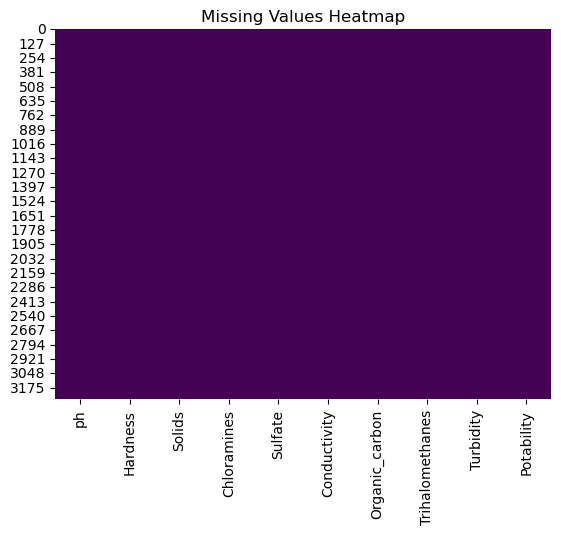

In [81]:
# Visualize missing values
sns.heatmap(cleaned_Data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

# Distribution Plots
    Visualize the distribution and outliers for numeric features.

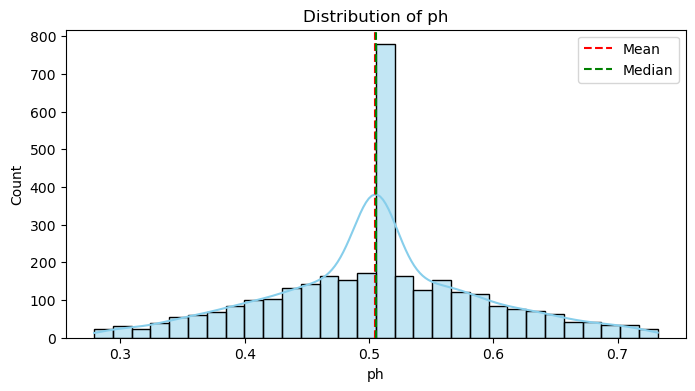

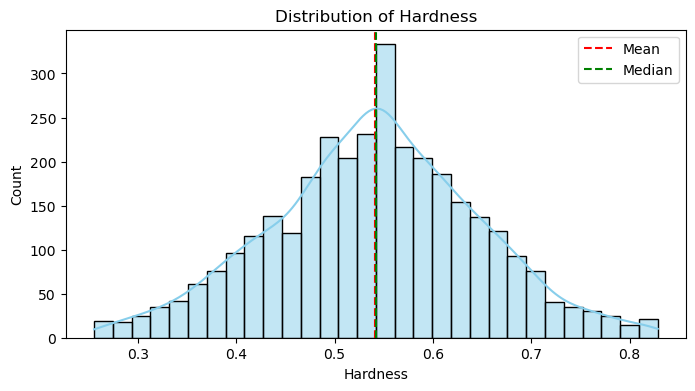

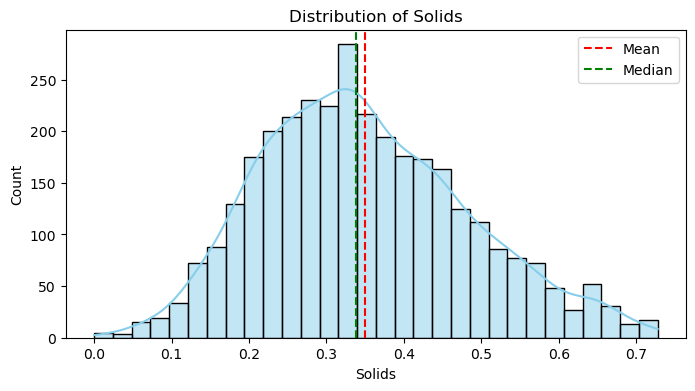

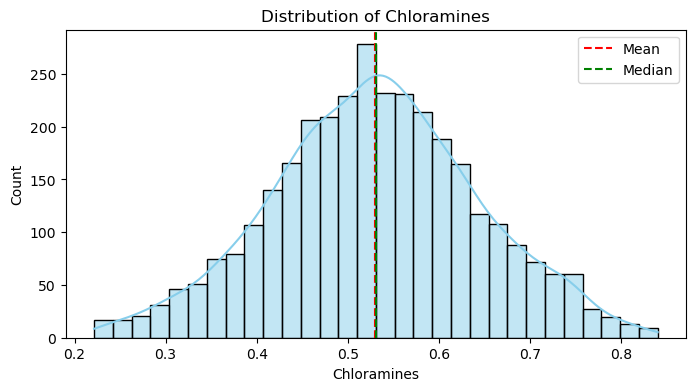

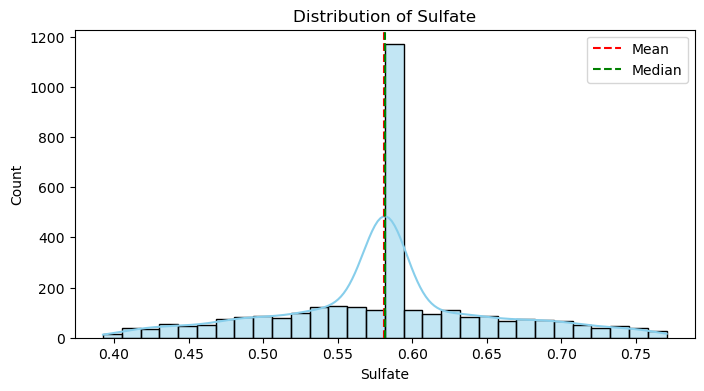

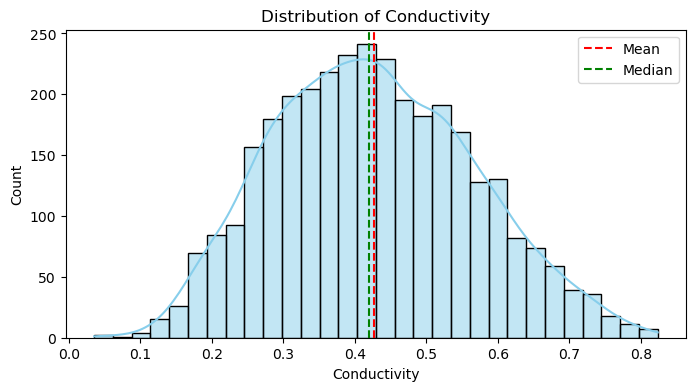

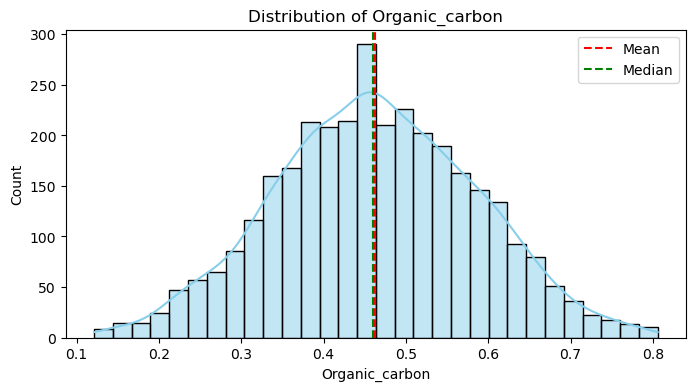

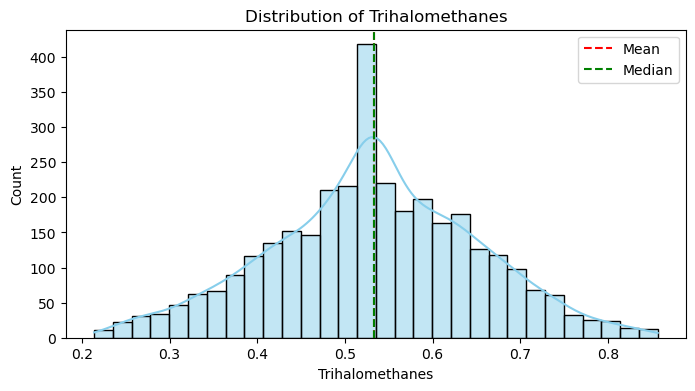

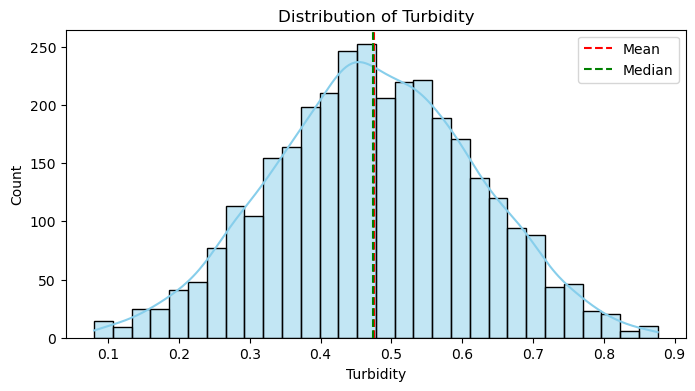

In [83]:
for col in cleaned_Data.columns[:-1]:  
    plt.figure(figsize=(8, 4))
    sns.histplot(cleaned_Data[col], bins=30, kde=True, color='skyblue')
    plt.axvline(cleaned_Data[col].mean(), color='red', linestyle='--', label='Mean')
    plt.axvline(cleaned_Data[col].median(), color='green', linestyle='--', label='Median')
    plt.title(f"Distribution of {col}")
    plt.legend()
    plt.show()


In [87]:
# Calculate IQR for each numeric column
Q1 = cleaned_Data.quantile(0.25)
Q3 = cleaned_Data.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
outliers = ((cleaned_Data < (Q1 - 1.5 * IQR)) | (cleaned_Data > (Q3 + 1.5 * IQR))).sum()
print("Number of outliers in each column:\n", outliers)


Number of outliers in each column:
 ph                 102
Hardness            36
Solids              12
Chloramines         16
Sulfate            410
Conductivity         0
Organic_carbon       3
Trihalomethanes     10
Turbidity            2
Potability           0
dtype: int64


# Handling the outlier 

    Replace with Mean/Median/Mode
    Useful for skewed distributions or if outliers aren't significant.

In [98]:
# Capping outliers to 1st and 99th percentile
lower_cap = cleaned_Data.quantile(0.01)
upper_cap = cleaned_Data.quantile(0.99)

df_capped = cleaned_Data.clip(lower=lower_cap, upper=upper_cap, axis=1)


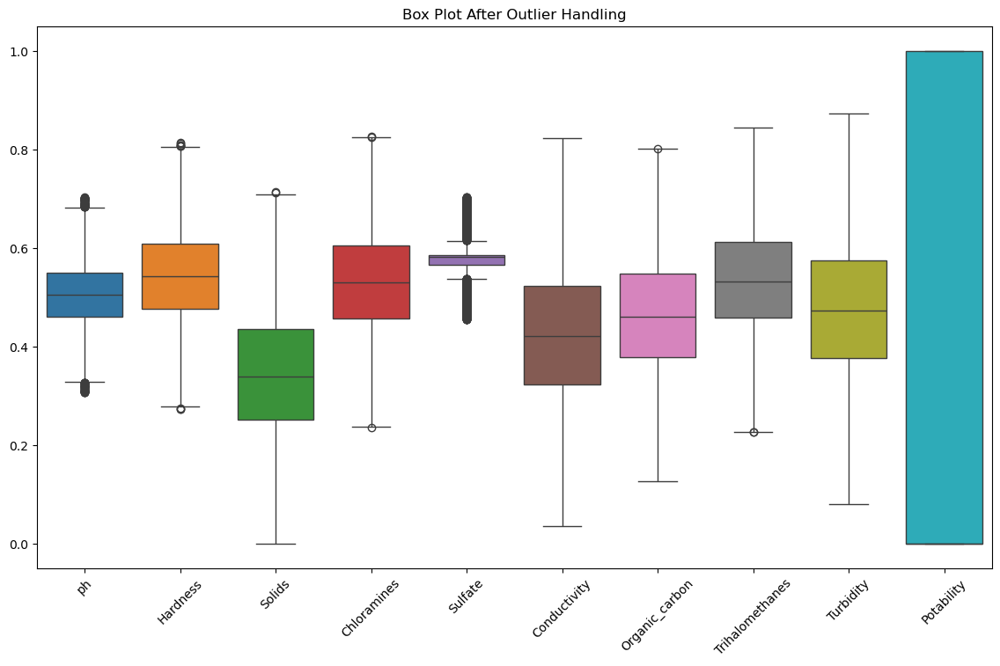

In [104]:
# Visualize outliers after handling
plt.figure(figsize=(14, 8))
sns.boxplot(data=cleaned_Data.select_dtypes(include='number'))
plt.xticks(rotation=45)
plt.title('Box Plot After Outlier Handling')
plt.show()

# Potability Analysis
    Analyze which factors significantly affect water potability.


# Correlation Analysis
    Check correlations between features and potability to identify influential factors.

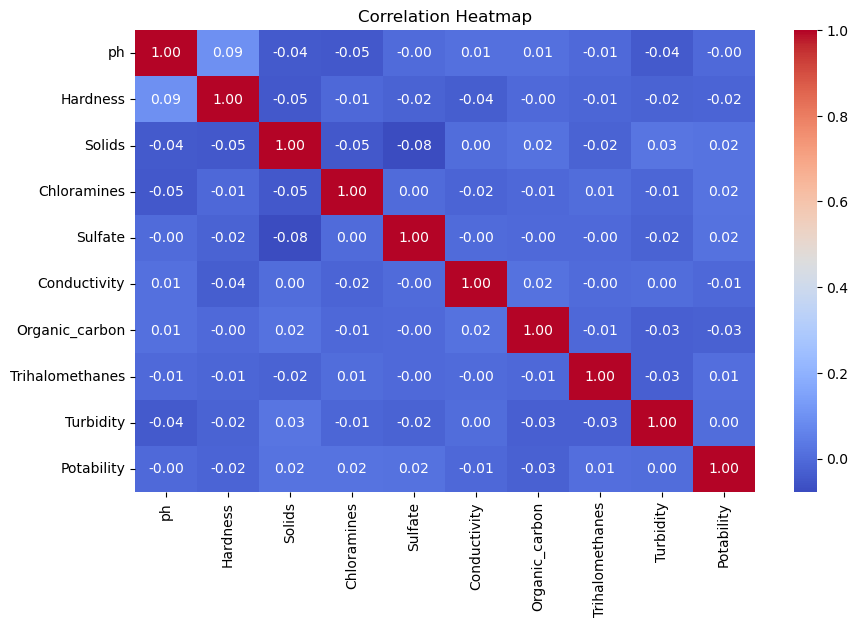

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix with the target variable
correlation = cleaned_Data.corr()
plt.figure(figsize=(10, 6))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Heatmap')
plt.show()


# Distribution Analysis
    Compare distributions of potable vs. non-potable water for key factors.

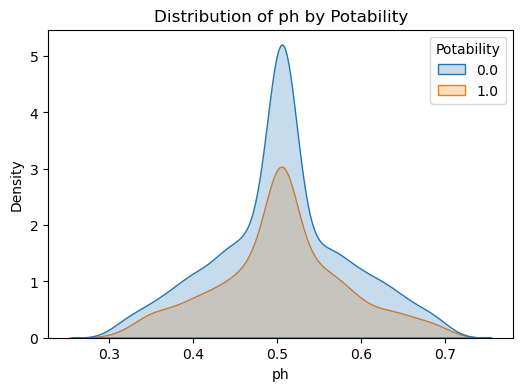

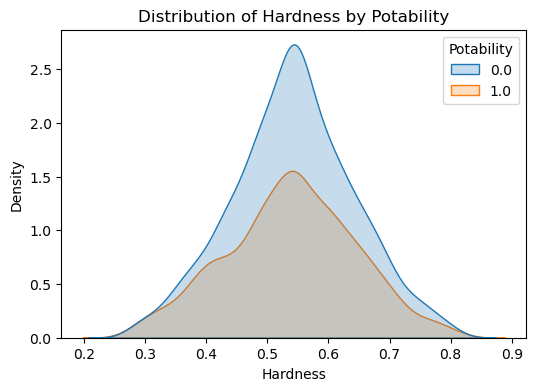

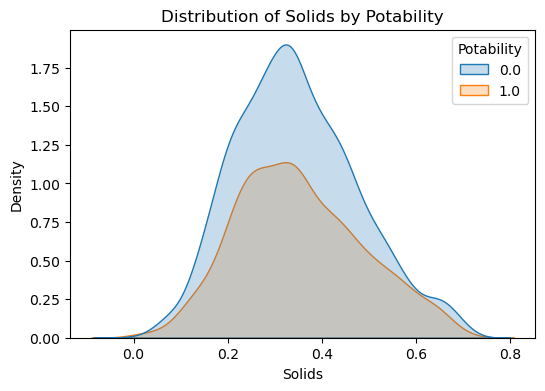

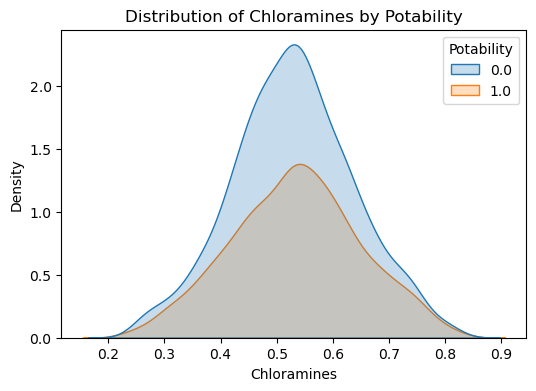

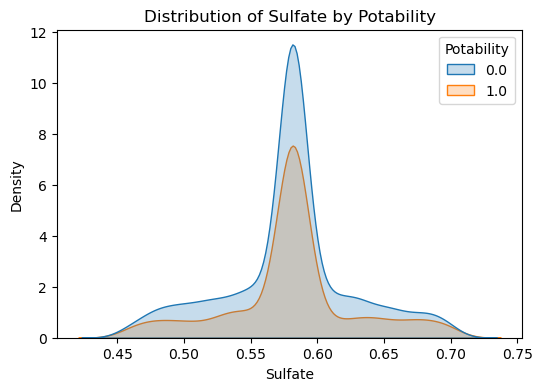

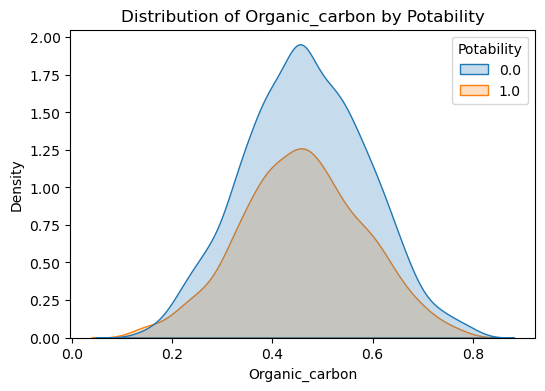

In [135]:
# Plotting distributions for key features
features = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Organic_carbon']
for feature in features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=cleaned_Data, x=feature, hue='Potability', fill=True)
    plt.title(f'Distribution of {feature} by Potability')
    plt.show()


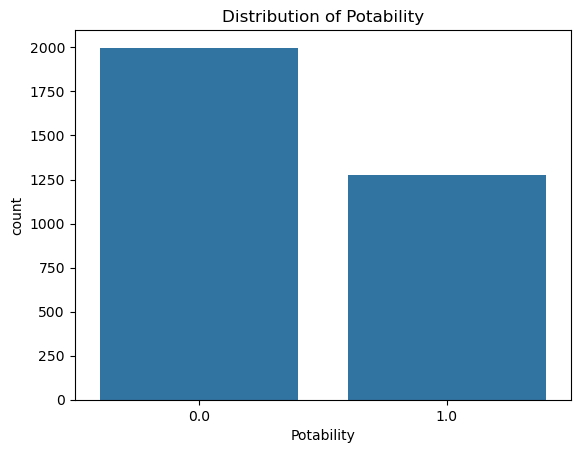

In [118]:
# Count plot for Potability
sns.countplot(x='Potability', data=cleaned_Data)
plt.title('Distribution of Potability')
plt.show()

#  Bivariate Analysis
    Explore the relationships between two variables, particularly with the target variable (Potability).

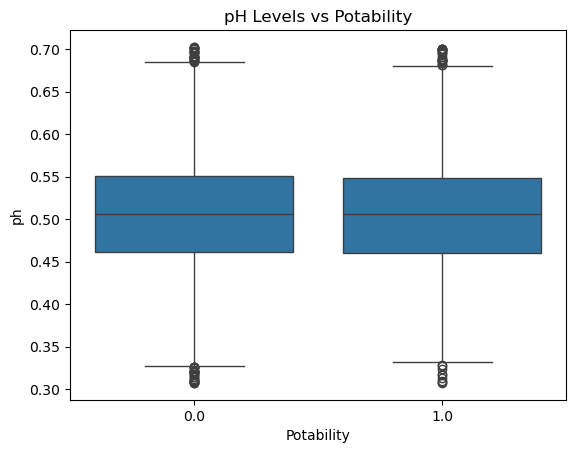

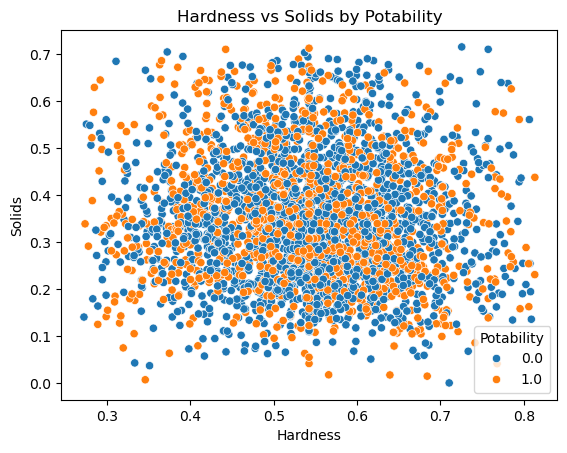

In [125]:
# Scatter plot for important features
sns.scatterplot(x='Hardness', y='Solids', hue='Potability', data=cleaned_Data)
plt.title('Hardness vs Solids by Potability')
plt.show()


# Multivariate Analysis
    Analyze interactions among multiple features for deeper insights.

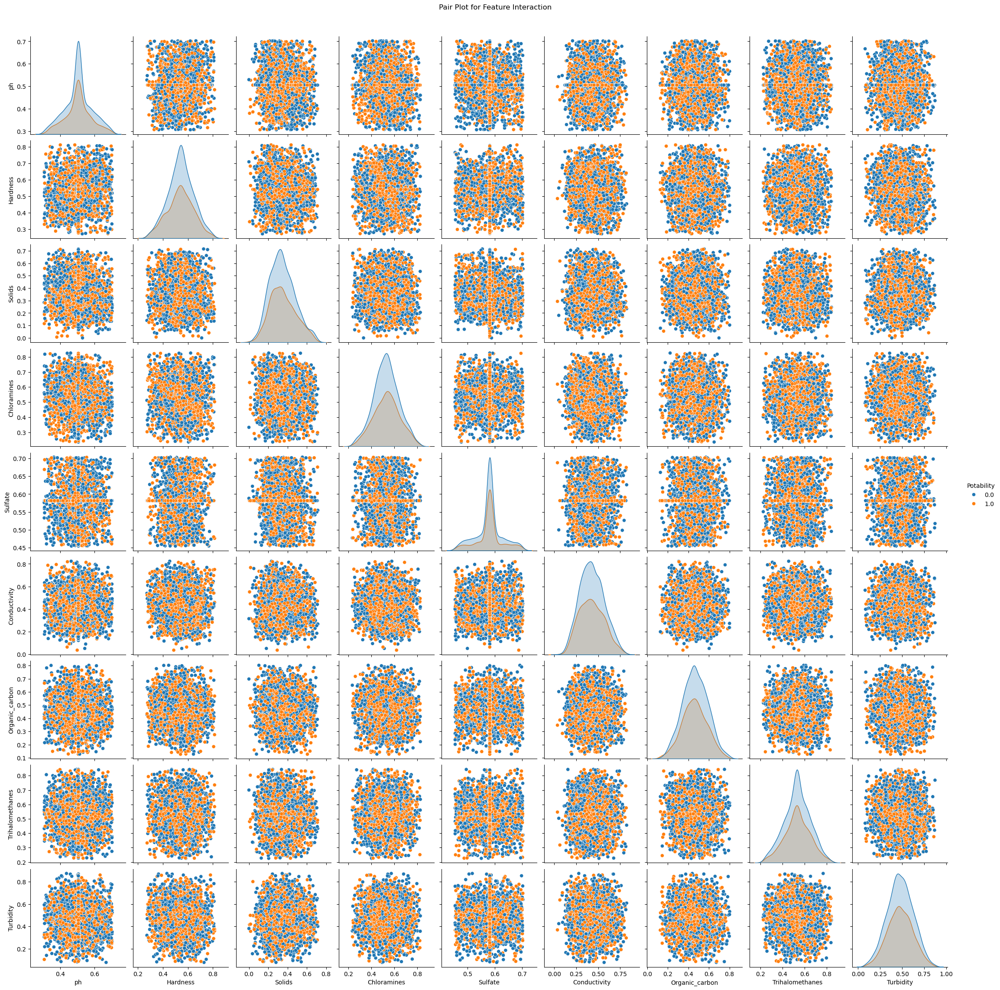

In [130]:
# Pair plot with hue
sns.pairplot(cleaned_Data, hue='Potability', diag_kind='kde')
plt.suptitle('Pair Plot for Feature Interaction', y=1.02)
plt.show()


# Hypothesis Testing
    Test whether there are significant differences in means for potable and non-potable water.

In [146]:
from scipy.stats import ttest_ind

for feature in features:
    potable = cleaned_Data[cleaned_Data['Potability'] == 1][feature]
    non_potable = cleaned_Data[cleaned_Data['Potability'] == 0][feature]

    t_stat, p_value = ttest_ind(potable.dropna(), non_potable.dropna())
    print(f"{feature}: t-statistic = {t_stat:.2f}, p-value = {p_value:.4f}")

    if p_value < 0.05:
        print(f"Significant difference in {feature} between potable and non-potable water!\n")
    else:
        print(f"No significant difference in {feature}\n")


ph: t-statistic = -0.19, p-value = 0.8496
No significant difference in ph

Hardness: t-statistic = -1.07, p-value = 0.2862
No significant difference in Hardness

Solids: t-statistic = 1.32, p-value = 0.1877
No significant difference in Solids

Chloramines: t-statistic = 1.22, p-value = 0.2241
No significant difference in Chloramines

Sulfate: t-statistic = 0.89, p-value = 0.3746
No significant difference in Sulfate

Organic_carbon: t-statistic = -1.50, p-value = 0.1326
No significant difference in Organic_carbon



# Trend Analysis
    Identify trends in water quality and factors influencing potability.
    Parameter Trends
    Analyze how different parameters influence potability.

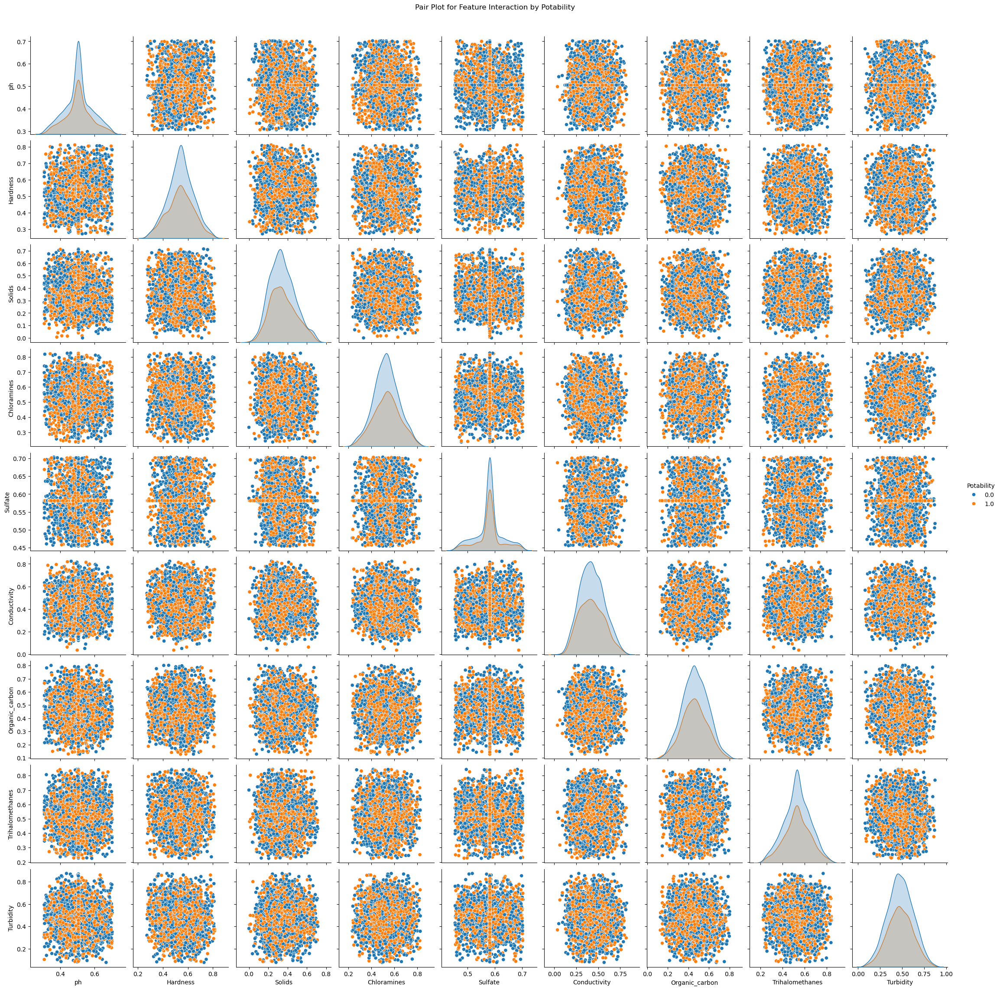

In [170]:
sns.pairplot(cleaned_Data, hue='Potability', diag_kind='kde')
plt.suptitle('Pair Plot for Feature Interaction by Potability', y=1.02)
plt.show()


# Trend by Index
    Even without a Date column, we can plot trends across the dataset index.

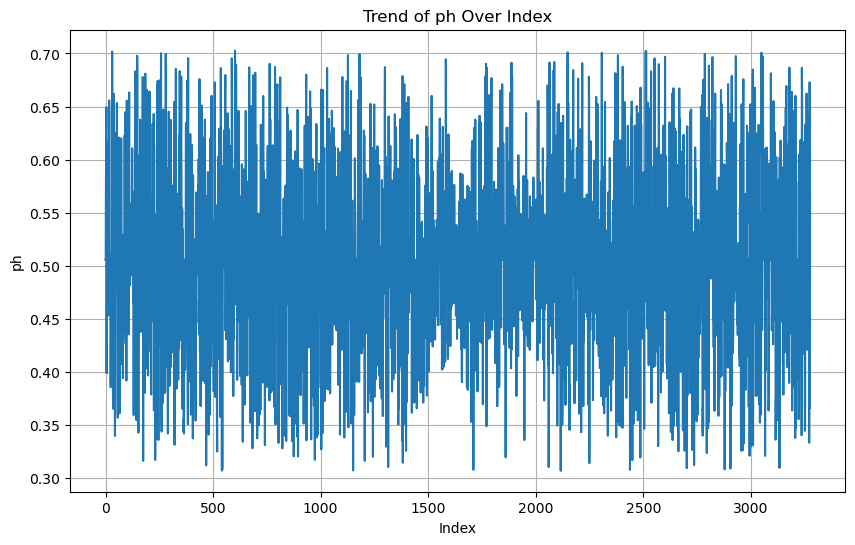

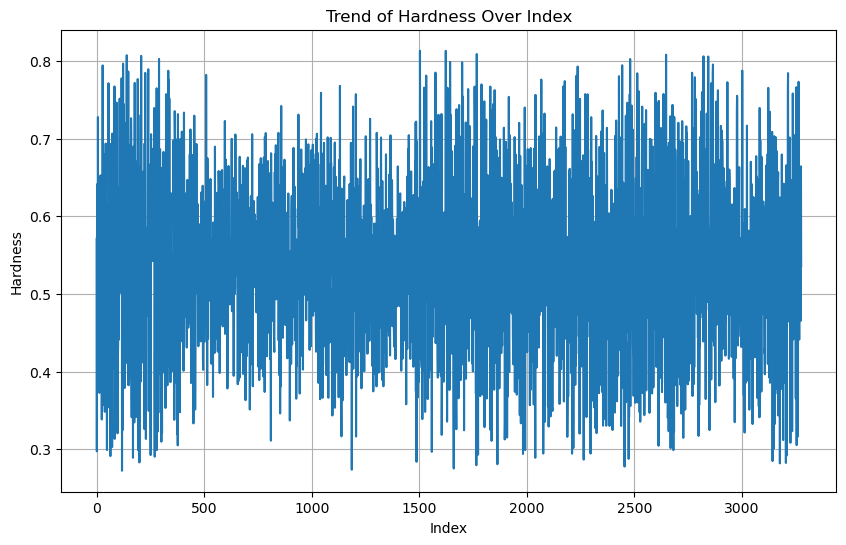

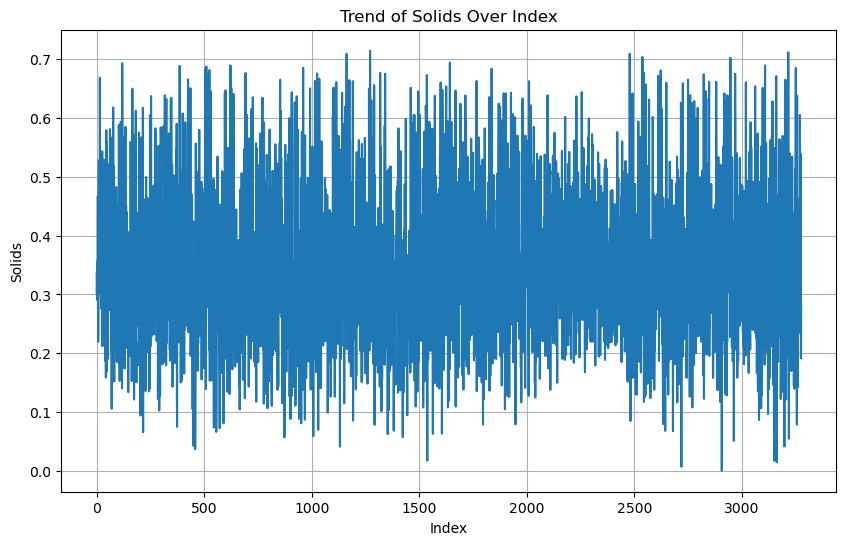

In [180]:
# Plot trends for key features using the index
features = ['ph', 'Hardness', 'Solids']

for feature in features:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x=cleaned_Data.index, y=feature, data=cleaned_Data)
    plt.title(f"Trend of {feature} Over Index")
    plt.xlabel("Index")
    plt.ylabel(feature)
    plt.grid(True)
    plt.show()
